# **Part 1 - Visualizing MVC Index in Manhattan**

## Load the geometry for the region being analyzed

In [1]:
import json
import folium
import requests
import carto2gpd
import matplotlib
import osmnx as ox
import numpy as np
import pandas as pd
import altair as alt
import networkx as nx
import geopandas as gpd
import matplotlib.pyplot as plt
from IPython.display import IFrame
from folium.plugins import HeatMap
import matplotlib.colors as mcolors

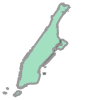

In [2]:
# get manhattan
districts = gpd.read_file('/Users/cyberhbliu/Desktop/30daymapchallenge/2/Community Districts.geojson')
districts.head()
manhattan = districts[districts['boro_cd'].astype(str).str.startswith('1')]
manhattan_outline = manhattan.geometry.unary_union
manhattan_outline

In [3]:
type(manhattan_outline)

shapely.geometry.multipolygon.MultiPolygon

### Get the street network graph

Use `OSMnx` to create a network graph (of type 'drive') from polygon boundary.

In [4]:
# get the graph
G = ox.graph_from_polygon(manhattan_outline, network_type='drive')

/Users/cyberhbliu/anaconda3/envs/musa/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/cyberhbliu/anaconda3/envs/musa/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/cyberhbliu/anaconda3/envs/musa/lib/python3.10/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)
/Users/cyberhbliu/anaconda3/envs/musa/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/cyberhbliu/anaconda3/envs/musa/lib/python3.10/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)


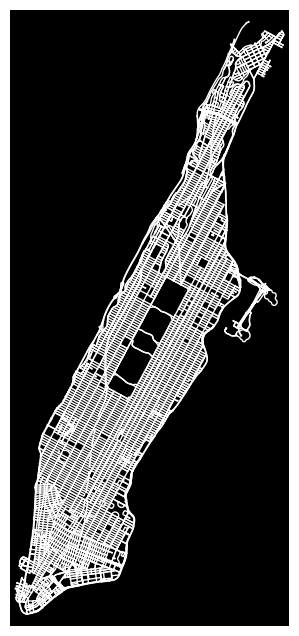

In [5]:
ox.plot_graph(ox.project_graph(G), 
              node_size=2,
              bgcolor="black",
              edge_color='white'
             );

### Convert network graph edges to a GeoDataFrame

In [6]:
manhattan_edges = ox.graph_to_gdfs(G, 
                                edges=True, 
                                nodes=False)
manhattan_edges.head()

osmid               name  \
u        v        key                                                       
42421728 42432736 0                          195743153  Central Park West   
         42435337 0                          195743153  Central Park West   
         42421731 0    [420625565, 420625573, 5668966]  West 106th Street   
42421731 42437916 0                            5671485   Manhattan Avenue   
         42432737 0                          195743186   Manhattan Avenue   

                           highway maxspeed  oneway reversed   length  \
u        v        key                                                   
42421728 42432736 0      secondary   25 mph   False    False   86.258   
         42435337 0      secondary   25 mph   False     True   85.345   
         42421731 0      secondary      NaN   False    False  138.033   
42421731 42437916 0    residential      NaN   False     True   86.149   
         42432737 0    residential      NaN   False    False   85.611   

                                                                geometry  \
u        v        key                                                      
42421728 42432736 0    LINESTRING (-73.96004 40.79805, -73.95996 40.7...   
         42435337 0    LINESTRING (-73.96004 40.79805, -73.96011 40.7...   
         42421731 0    LINESTRING (-73.96004 40.79805, -73.96017 40.7...   
42421731 42437916 0    LINESTRING (-73.96147 40.79865, -73.96154 40.7...   
         42432737 0    LINESTRING (-73.96147 40.79865, -73.96140 40.7...   

                      lanes  ref access bridge tunnel width junction  
u        v        key                                                 
42421728 42432736 0     NaN  NaN    NaN    NaN    NaN   NaN      NaN  
         42435337 0     NaN  NaN    NaN    NaN    NaN   NaN      NaN  
         42421731 0     NaN  NaN    NaN    NaN    NaN   NaN      NaN  
42421731 42437916 0     NaN  NaN    NaN    NaN    NaN   NaN      NaN  
         42432737 0     NaN  NaN    NaN    NaN    NaN   NaN      NaN

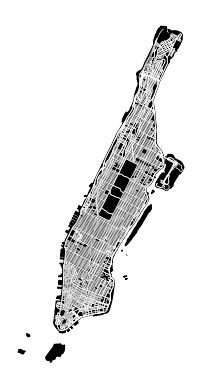

In [7]:
ax3 = manhattan_edges.to_crs(epsg=2272).plot(color='white', linewidth=0.5)
boundary = gpd.GeoSeries([manhattan_outline], crs='EPSG:4326')
boundary.to_crs(epsg=2272).plot(ax=ax3, facecolor='black', edgecolor='black', linewidth=1, zorder=1)
ax3.set_axis_off()

### Load MVC data from NYC open data

The Motor Vehicle Collisions crash table contains details on the crash event. Each row represents a crash event. The Motor Vehicle Collisions data tables contain information from all police reported motor vehicle collisions in NYC.

In [8]:
# input data and get the crash for the year 2023
crash = pd.read_csv('/Users/cyberhbliu/Desktop/30daymapchallenge/2/Motor_Vehicle_Collisions_-_Crashes_20231102.csv') 
crash['CRASH DATE'] = pd.to_datetime(crash['CRASH DATE'])
crash = crash[crash['CRASH DATE'].dt.year == 2023]
crash

/var/folders/rp/0t393qy94k3_n1h8yry822hr0000gn/T/ipykernel_45389/3773034284.py:2: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  crash = pd.read_csv('/Users/cyberhbliu/Desktop/30daymapchallenge/2/Motor_Vehicle_Collisions_-_Crashes_20231102.csv')


,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
43531,2023-05-23,11:00,NaN,NaN,NaN,NaN,NaN,7 AVENUE,18 STREET,NaN,...,Other Vehicular,NaN,NaN,NaN,4631594,Sedan,Sedan,NaN,NaN,NaN
115935,2023-05-17,10:32,MANHATTAN,10013.0,40.718777,-73.995705,"(40.718777, -73.995705)",GRAND STREET,ELIZABETH STREET,NaN,...,NaN,NaN,NaN,NaN,4631953,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,NaN
116892,2023-09-14,7:00,QUEENS,11101.0,40.739490,-73.938410,"(40.73949, -73.93841)",NaN,NaN,49-49 30 STREET,...,Unspecified,NaN,NaN,NaN,4663636,Sedan,NaN,NaN,NaN,NaN
116922,2023-09-17,0:30,QUEENS,11435.0,40.699220,-73.806435,"(40.69922, -73.806435)",NaN,NaN,147-25 94 AVENUE,...,Unspecified,NaN,NaN,NaN,4663437,Sedan,NaN,NaN,NaN,NaN
145818,2023-09-21,5:49,MANHATTAN,10065.0,40.763110,-73.962524,"(40.76311, -73.962524)",EAST 63 STREET,2 AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,4664283,Sedan,Sedan,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2038637,2023-09-19,15:55,NaN,NaN,40.761436,-73.761760,"(40.761436, -73.76176)",NORTHERN BOULEVARD,NaN,NaN,...,Driver Inattention/Distraction,NaN,NaN,NaN,4663574,2 dr sedan,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN
2038638,2023-09-14,23:15,MANHATTAN,10016.0,40.744064,-73.987755,"(40.744064, -73.987755)",WEST 27 STREET,5 AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,4664015,Sedan,NaN,NaN,NaN,NaN
2038639,2023-09-12,16:00,QUEENS,11433.0,40.707947,-73.783310,"(40.707947, -73.78331)",JAMAICA AVENUE,178 STREET,NaN,...,NaN,NaN,NaN,NaN,4664202,Sedan,NaN,NaN,NaN,NaN
2038640,2023-09-19,10:45,NaN,NaN,40.840230,-73.880104,"(40.84023, -73.880104)",EAST TREMONT AVENUE,BOSTON ROAD,NaN,...,Unspecified,NaN,NaN,NaN,4663887,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN


### Trim the crash data to Manhattan

Trim the crashes using the `within()` function of the crash GeoDataFrame to find which crashes are within the boundary.

In [9]:
crash_geo = gpd.GeoDataFrame(crash, geometry=gpd.points_from_xy(crash.LONGITUDE, crash.LATITUDE))
manhattan_area = boundary.geometry.unary_union.convex_hull
points = crash_geo.within(manhattan_area) 
points

43531      False
115935      True
116892     False
116922     False
145818      True
           ...  
2038637    False
2038638     True
2038639    False
2038640    False
2038641    False
Length: 79401, dtype: bool

In [10]:
crash_manhattan = crash_geo.loc[points].copy()
crash_manhattan.reset_index(inplace=True, drop=True)
len(crash_manhattan)

15198

In [11]:
# make sure the approriate CRS in manhattan
G_2263 = ox.project_graph(G, to_crs='EPSG:2263')
G_2263.graph['crs']

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [12]:
# the reason I set 4326 crs first is that the dataframe needs to get a projection to avoild value error.
# or else I was told that it *cannot transform naive geometries*
crash_manhattan.crs = 'epsg:4326'
crash_manhattan.to_crs(epsg=2263)
crash_manhattan2263 = crash_manhattan.to_crs(epsg=2263)
crash_manhattan2263.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

### Find the nearest edge for each crash, calculate the total number of crashes per street

It returns a dataframe with 3 columns that represent `(u, v, key)` where each `u` and `v` are the node IDs that the edge links together. 'key' can be ignored.

In [13]:
nearest = ox.distance.nearest_edges(G_2263, X=crash_manhattan2263['geometry'].x, Y=crash_manhattan2263['geometry'].y)
nearest_array = np.array(nearest)
nearest_df = pd.DataFrame(nearest_array, columns = ['u','v','key'])
nearest_count = nearest_df.groupby(['u','v']).count().reset_index().rename(columns={'key':'crash_count'})
nearest_count.head()

,u,v,crash_count
0,42421728,42432736,1
1,42421737,42437917,1
2,42421769,42443347,3
3,42421772,42442469,6
4,42421775,1061531525,4


### Merge edges GeoDataFrame and crash count DataFrame, then get the **Crash Index**

`crash index` provides a normalized measure of the crash frequency per street.
1. Calculate the total crash count divided by the street length, using the `length` column
2. Perform a log transformation of the crash/length variable — use numpy's `log10()` function
3. Normalize the index from 0 to 1

In [14]:
crash_manhattan_count = pd.merge(manhattan_edges, nearest_count, how='left', on=['u','v'])
crash_manhattan_count['divide_index'] = crash_manhattan_count['crash_count']/crash_manhattan_count['length']
crash_manhattan_count['log10_index'] = crash_manhattan_count['divide_index'].apply(np.log10)
crash_manhattan_count.head()

,u,v,osmid,name,highway,maxspeed,oneway,reversed,length,geometry,lanes,ref,access,bridge,tunnel,width,junction,crash_count,divide_index,log10_index
0,42421728,42432736,195743153,Central Park West,secondary,25 mph,False,False,86.258,"LINESTRING (-73.96004 40.79805, -73.95996 40.7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.011593,-1.935799
1,42421728,42435337,195743153,Central Park West,secondary,25 mph,False,True,85.345,"LINESTRING (-73.96004 40.79805, -73.96011 40.7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,42421728,42421731,"[420625565, 420625573, 5668966]",West 106th Street,secondary,NaN,False,False,138.033,"LINESTRING (-73.96004 40.79805, -73.96017 40.7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,42421731,42437916,5671485,Manhattan Avenue,residential,NaN,False,True,86.149,"LINESTRING (-73.96147 40.79865, -73.96154 40.7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,42421731,42432737,195743186,Manhattan Avenue,residential,NaN,False,False,85.611,"LINESTRING (-73.96147 40.79865, -73.96140 40.7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
min_val = crash_manhattan_count['log10_index'].min()
max_val = crash_manhattan_count['log10_index'].max()
normalized = (crash_manhattan_count['log10_index'] - min_val) / (max_val - min_val)
crash_manhattan_count['index_normalized'] = normalized

### Plot a histogram of the Crash Index values

Text(0.5, 1.0, 'Crash Index of Manhattan, 2023')

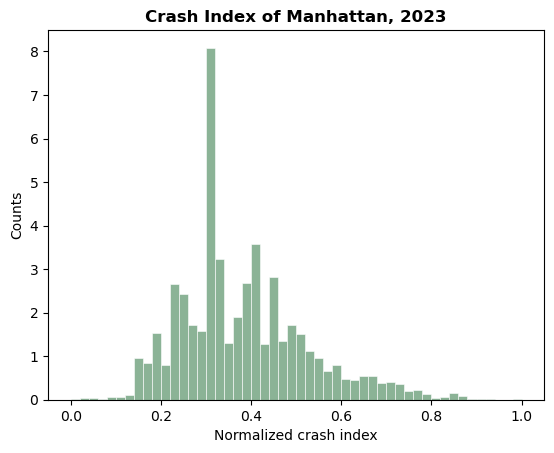

In [17]:
plt.hist(crash_manhattan_count['index_normalized'], 50, density = True, 
         histtype ='bar',
         color = '#8bb396',
         ec = "white",
         lw = 0.4)
plt.xlabel('Normalized crash index')
plt.ylabel('Counts')
  
plt.title('Crash Index of Manhattan, 2023',
          fontweight ="bold")

### Plot the street networks

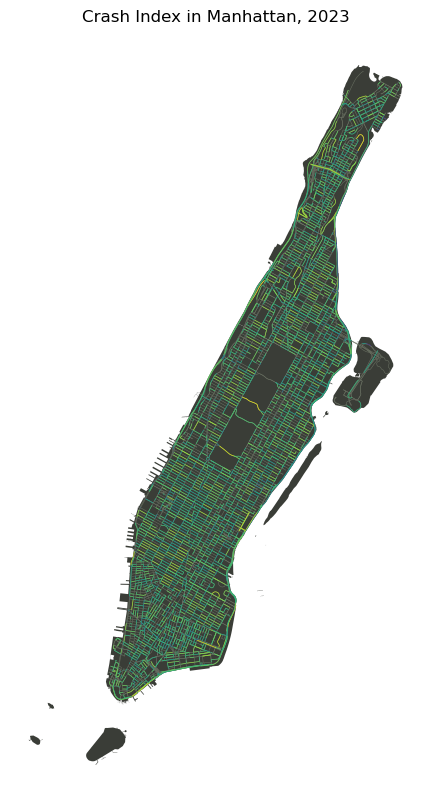

In [25]:
import contextily as ctx

fig, ax = plt.subplots(figsize = (10,10))

manhattan.plot(ax = ax, color = '#3a3d37')
manhattan_edges.plot(ax = ax, color = '#676e60', linewidth=0.4)
crash_manhattan_count.plot(column ='index_normalized', 
                         ax = ax, 
                         cmap = 'viridis_r',
                         linewidth=0.5
                        )

ax.set_title('Crash Index in Manhattan, 2023')
ax.set_axis_off()

In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
import osmnx as ox
import contextily as ctx
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import calendar


def prepare_data_for_month(month):
    # Filter out the crash data for the year 2023 and specific month
    crash_month = crash[(crash['CRASH DATE'].dt.year == 2023) & (crash['CRASH DATE'].dt.month == month)]
    # Convert to GeoDataFrame
    crash_geo = gpd.GeoDataFrame(crash_month, geometry=gpd.points_from_xy(crash_month.LONGITUDE, crash_month.LATITUDE))
    
    # Determine which crashes are within the Manhattan area
    points = crash_geo.within(manhattan_area)
    crash_manhattan = crash_geo.loc[points].copy()
    crash_manhattan.reset_index(inplace=True, drop=True)

    # Project the graph and data to EPSG:2263
    G_2263 = ox.project_graph(G, to_crs='EPSG:2263')
    crash_manhattan.crs = 'epsg:4326'
    crash_manhattan2263 = crash_manhattan.to_crs(epsg=2263)
    
    # Compute the nearest edges to each crash
    nearest = ox.distance.nearest_edges(G_2263, X=crash_manhattan2263['geometry'].x, Y=crash_manhattan2263['geometry'].y)
    nearest_array = np.array(nearest)
    nearest_df = pd.DataFrame(nearest_array, columns=['u','v','key'])
    
    # Count the crashes by edge
    nearest_count = nearest_df.groupby(['u','v']).count().reset_index().rename(columns={'key':'crash_count'})
    
    # Merge and compute the crash index
    crash_manhattan_count = pd.merge(manhattan_edges, nearest_count, how='left', on=['u','v'])
    crash_manhattan_count['divide_index'] = crash_manhattan_count['crash_count'] / crash_manhattan_count['length']
    crash_manhattan_count['log10_index'] = crash_manhattan_count['divide_index'].apply(np.log10)
    min_val = crash_manhattan_count['log10_index'].min()
    max_val = crash_manhattan_count['log10_index'].max()
    normalized = (crash_manhattan_count['log10_index'] - min_val) / (max_val - min_val)
    crash_manhattan_count['index_normalized'] = normalized
    
    return crash_manhattan_count

fig, ax = plt.subplots(figsize=(18,20))
manhattan.plot(ax=ax, facecolor='none', edgecolor='none')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatterNoLabels)
ax.set_title('Crash Index in Manhattan, 2023')
ax.set_axis_off()

def update(month):
    ax.clear()
    manhattan.plot(ax=ax, facecolor='none', edgecolor='none')
    crash_manhattan_count = prepare_data_for_month(month) 
    crash_manhattan_count.plot(column='index_normalized', ax=ax, cmap='viridis_r', linewidth=1)
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatterNoLabels)
    ax.set_title(f'Crash Index in Manhattan, {calendar.month_name[month]}, 2023')
    ax.set_axis_off()

# Create animation
ani = animation.FuncAnimation(fig, update, frames=range(1, 11), repeat=False)

img = plt.imshow([[0, 1]], cmap='viridis_r')
img.set_visible(False)
cbar = plt.colorbar(orientation='vertical', shrink=0.5)
cbar.set_label('Crash Index', size=12)
yticks = np.linspace(0, 1, 5)
cbar.set_ticks(yticks)
cbar.set_ticklabels(['{:.2f}'.format(i) for i in yticks])

ani

# **Part 2 - Interactive Web Maps in Folium**

### An interactive map of the crash index
Remove some unused columns and use `Folium` to make an interactive version of the map from the previous section. 

#### Steps:
1. Initialize the map
2. Add the street network GeoJson to the map
3. Add the crash street GeoJson to the map
4. Add a Legend to the map

In [31]:
#select the columns I need to plot
cols = ['name', 'index_normalized', 'crash_count', 'geometry']
need_data = crash_manhattan_count[cols]
need_data = need_data.dropna() 
need_data = need_data.to_crs(epsg=4326)

In [32]:
crash_json = need_data.to_json()
central_json = manhattan_edges.to_json()

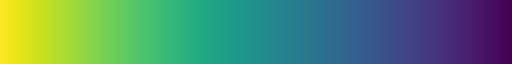

In [33]:
cmap = plt.get_cmap('viridis_r')
cmap

In [34]:
#define 
def get_neighborhood_style(feature):
    """Return a style dict."""
    return {"color": "#556158",
            "weight": 1.2,
           "fillOpacity": 0.2}


def get_highlighted_style(feature):
    """Return a style dict when highlighting a feature."""
    return {"weight": 3, "color": "orange"}

def get_style(feature):
    """
    Given an input GeoJSON feature, return a style dict.
    
    Notes
    -----
    The color in the style dict is determined by the 
    "index_normalized" column in the input "feature".
    """
    # Get the data value from the feature
    value = feature['properties']['index_normalized']
    
    # Evaluate the color map
    # NOTE: value must between 0 and 1
    rgb_color = cmap(value) # this is an RGB tuple
    
    # Convert to hex string
    color = mcolors.rgb2hex(rgb_color)
    
    # Return the style dictionary
    return {'weight': 1, 
            'color': color, 
            'fillColor': color, 
            "fillOpacity": 1}

In [36]:
m = folium.Map(
    location=[40.765840813646776, -73.98226327925299],
    tiles='Cartodb dark_matter',
    zoom_start=12.5
)


folium.GeoJson(
    central_json,
    style_function=get_neighborhood_style, 
    tooltip=folium.GeoJsonTooltip(['name'])
).add_to(m)


folium.GeoJson(
    crash_json, 
    style_function=get_style, # The style function to color counties differently
    highlight_function=get_highlighted_style, 
    tooltip=folium.GeoJsonTooltip(['name','crash_count'])
).add_to(m)


legend_html = """
<div style="position: fixed; bottom: 50px; left: 50px; width: 100px; height: 180px; border:0px solid grey; z-index:9999; font-size:14px; background-color: none; opacity: 1;">
    <b style="color: white;">Crash Index:</b><br>
    <div style="background-color: #ffffcc; width: 20px; height: 20px; display: inline-block;"></div><span style="color: white;"> Low<br>
    <div style="background-color: #c2e699; width: 20px; height: 20px; display: inline-block;"></div><br>
    <div style="background-color: #78c679; width: 20px; height: 20px; display: inline-block;"></div><br>
    <div style="background-color: #31a354; width: 20px; height: 20px; display: inline-block;"></div><br>
    <div style="background-color: #006837; width: 20px; height: 20px; display: inline-block;"></div><span style="color: white;"> High<br>
</div>
"""

m.get_root().html.add_child(folium.Element(legend_html))

m.save("crash_index_manhattan_2023_interactive.html")
m